# STEP 1: Motivation Pitch

* The theory of economic complexity, developed at the [Center for International Development](http://www.cid.harvard.edu) at Harvard University, tries to explain why some countries are poor and unstable while others are rich and prosperous.
* Over the past decade we have worked hard to develop a theory of growth that explain variations in countries growth rates.


In [24]:
import urllib.request
import json

In [25]:
# Loading WDI data on countries (1995 - 2013)
with open("sourceData/countries_wdi.json") as data_file:    
    countries_wdi = json.load(data_file)

In [26]:
# Dictionnary with some WDI indicators
countries_wdi[0]

{'continent': 'Africa',
 'country_id': 4,
 'id_topo': '24',
 'latitude': -8.81155,
 'longitude': 13.242,
 'name': 'Angola',
 'name_2char': 'ao',
 'name_3char': 'ago',
 'years': [{'GDP (current US$)': 5039534776.4902,
   'GDP per capita (constant 2005 US$)': 1045.35860686813,
   'Life expectancy at birth, total (years)': 42.0514634146341,
   'Population, total': 12104952.0,
   'Scientific and technical journal articles': 2.9,
   'balance': 1471258357.2939997,
   'eci': -2.244171,
   'gdp': 12650000000.0,
   'population': 12104952,
   'total_export_value': 3128656139.2939997,
   'total_import_value': 1657397782.0,
   'year': 1995},
  {'GDP (current US$)': 7526446605.51712,
   'GDP per capita (constant 2005 US$)': 1130.04558917706,
   'Life expectancy at birth, total (years)': 42.5016341463415,
   'Population, total': 12451945.0,
   'Scientific and technical journal articles': 1.0,
   'balance': 2230857716.224998,
   'eci': -1.71968,
   'gdp': 14070000000.0,
   'population': 12451945,
   

In [27]:
# Temporal data are nested under the 'years' attribtue
countries_wdi_flat = {}
for index, item in enumerate(countries_wdi):
    countries_wdi_flat[index] = countries_wdi[index]
    countries_wdi_flat[index]['total_export_value'] =  item['years'][0]['total_export_value']
    countries_wdi_flat[index]['total_import_value'] =  item['years'][0]['total_import_value']
    countries_wdi_flat[index]['year'] =  item['years'][0]['year']
    countries_wdi_flat[index].pop('years', None)

In [28]:
# Flatten the data for the first year (1995)
countries_wdi_flat[0]

{'continent': 'Africa',
 'country_id': 4,
 'id_topo': '24',
 'latitude': -8.81155,
 'longitude': 13.242,
 'name': 'Angola',
 'name_2char': 'ao',
 'name_3char': 'ago',
 'total_export_value': 3128656139.2939997,
 'total_import_value': 1657397782.0,
 'year': 1995}

In [29]:
# TODO: MAP OF THE WORLD BY GDP
# geomap = vistk.Geomap(id='name', color='continent', name='name',
#                                x='avg_products', y='nb_products', 
#                                r='value')
# geomap.draw(flat_data)

from IPython.display import IFrame
IFrame('http://cid-harvard.github.io/vis-toolkit/examples/geomap.html', width=700, height=350)

# GDP per capita
* Source http://www.theworldeconomy.org/statistics.htm

In [30]:
# sourceData/world_gdp_0_1998.json

from IPython.display import IFrame
IFrame('http://127.0.0.1/rv/Dev/atlas-labs/davos/world_gdp.html', width=700, height=350)

# STEP 2

This is a picture of the world.

<img src='img/MCP_matrix.png'>

* Dots on the matrix, represents a significant export for one of the world’s countries. 
* Each column in the graph is one country. 
* Each row in the graph is one exported product. 
* Strong color represents whether the product is ‘significant’ for that country or not. 

Finding

* We find that countries that make few products, make products made by many countries. 
* Countries that make many products, also make products made by few other countries.
Takeaway
* The rarest products are typically found in the most highly diversified countries.

TODO
* Find SITC-4 Products matrix data
* 772 products for 129 countries (year 2000)


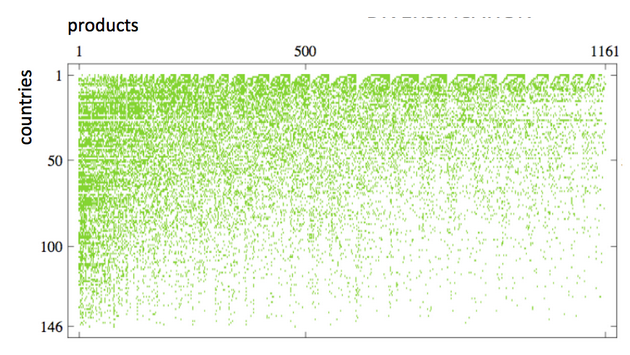

In [31]:
from IPython.core.display import Image
Image('img/MCP_matrix.png')

In [ ]:
# Generates a random Matrix
import numpy as np

In [41]:
mcp = np.fromfile("sourcedata/atlas-mcp-matrix.txt").reshape((124,1355))

In [42]:
len(mcp)

124

In [50]:
%matplotlib inline
import matplotlib.pylab as plt

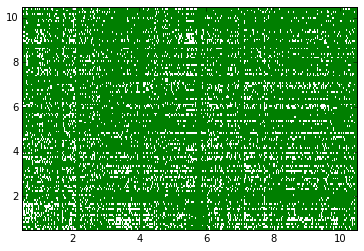

In [51]:
plt.imshow(mcp, interpolation='nearest', cmap=plt.cm.ocean, extent=(0.5,10.5,0.5,10.5), 
           aspect='auto')

In [52]:
mcp = mcp[mcp[:,0].argsort()]

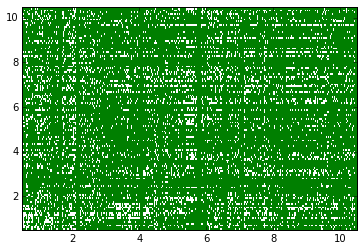

In [53]:
plt.imshow(mcp, interpolation='nearest', cmap=plt.cm.ocean, extent=(0.5,10.5,0.5,10.5), 
           aspect='auto')

In [54]:

matrix = np.random.rand(1161, 146)

# Sort by first column/row
matrix[matrix[:,0].argsort()]

array([[  5.48209560e-05,   1.94220837e-01,   2.24839916e-01, ...,
          3.25833285e-01,   9.10439075e-01,   3.86754400e-01],
       [  5.78482874e-04,   3.31008895e-01,   2.43932372e-01, ...,
          2.93126037e-01,   6.73531772e-01,   3.19166226e-01],
       [  8.65990872e-04,   3.98068616e-02,   4.91667378e-01, ...,
          7.84076209e-01,   8.69358386e-01,   3.03057537e-01],
       ..., 
       [  9.95576432e-01,   9.84282827e-01,   9.15622969e-01, ...,
          1.53628929e-01,   4.93292120e-01,   3.35636825e-01],
       [  9.97233988e-01,   2.41565987e-01,   3.11341687e-01, ...,
          7.63191768e-01,   5.05437651e-01,   8.57626976e-02],
       [  9.98548299e-01,   2.63734524e-03,   4.88459705e-02, ...,
          5.17738962e-01,   3.01610607e-01,   9.21022096e-02]])

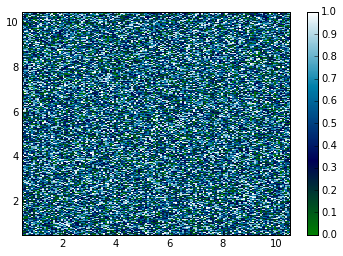

In [55]:

plt.imshow(matrix, interpolation='nearest', cmap=plt.cm.ocean, extent=(0.5,10.5,0.5,10.5), 
           aspect='auto')
plt.colorbar()
plt.show()
#

## Ubiquity vs Diversity
* 

In [160]:
# sourceData/diversification_ubiquity_hs4_1995_2012.json

from IPython.display import IFrame
IFrame('http://127.0.0.1/rv/Dev/atlas-labs/davos/scatterplot.html', width=700, height=350)

# STEP 3

Transition

* To understand which products represent the best opportunities for countries to export, we turn to look at them deeper.

Finding
* Diversity – the number of products each country exports
* Ubiquity – the number of countries the product is exported to
* When a country exports a certain product – it means the country has certain knowledge and capabilities to do so.

Takeaway
* Countries should focus on gathering the capabilities that will allow them to make more “valuable” products – product with higher scores of diversity and ubiquity, which we refer to as more “complex” products. 

TODO
* Formula
* Bipartite graph


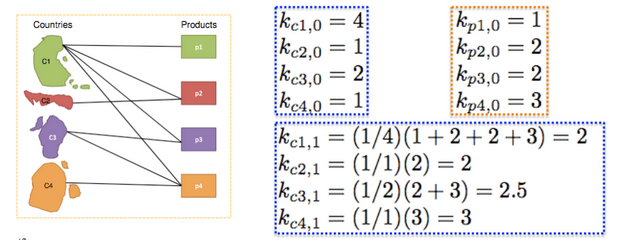

In [161]:
from IPython.core.display import Image
Image('img/CP_bipartite.png')

In [162]:
from IPython.display import display, Math, Latex
display(Math(r'F(k) = \int_{-\infty}^{\infty} f(x) e^{2\pi i k} dx'))

<IPython.core.display.Math object>

# STEP 4: The product space

What we see

* When presenting all of the products and export links between countries, we get a “network” of the world’s exports – which we call the “product space”.
Finding
•	To increase their complexity and grow, countries should diversify and develop capabilities in many nodes at the center of the network.

TODO
* Load product space
* Split in two to compare years

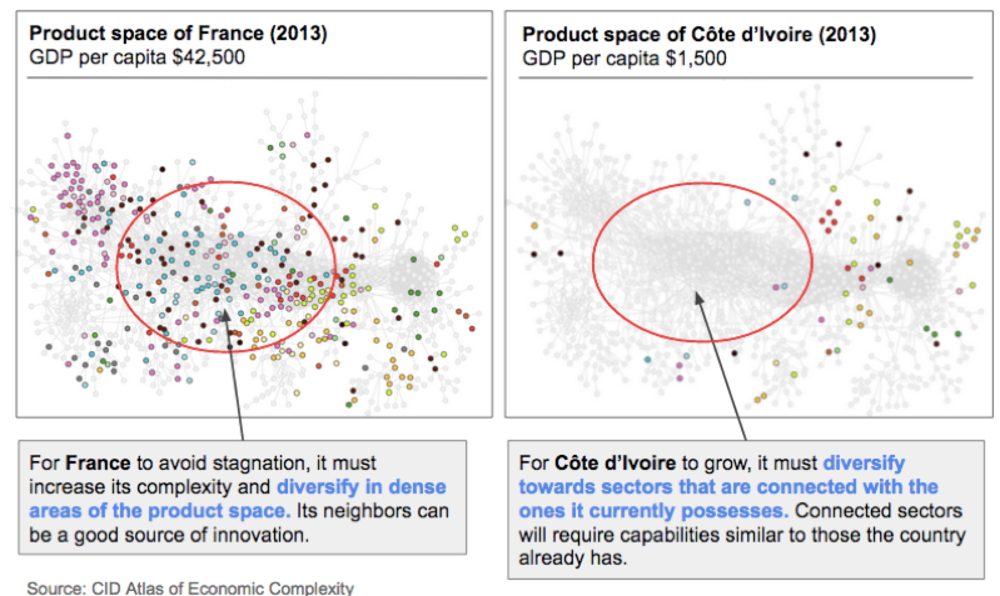

In [163]:
from IPython.core.display import Image
Image('img/PS_comparison.png')

# STEP 5: Economic Complexity

Finding
* CID researchers have developed a model that suggests present and future growth is driven by the ‘complexity’ of a country’s product space
* Our research shows that economic complexity is highly correlated with income per capita.

TODO
* Retrieve Data
* Plot scatterplot
* Add regression line

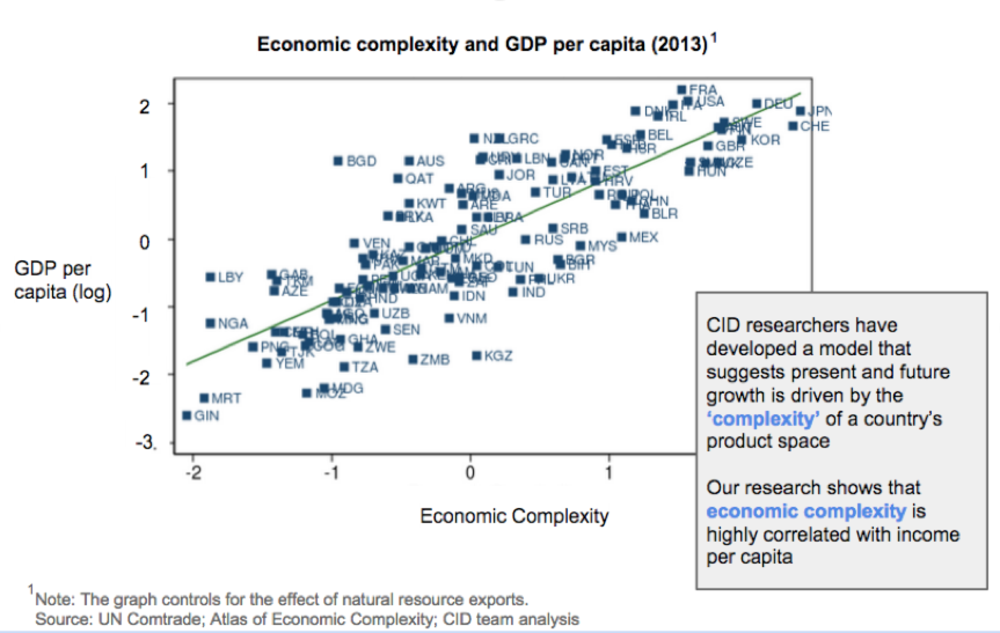

In [164]:
from IPython.core.display import Image
Image('img/ECI_scatterplot.png')

In [165]:
# STEP 6: DIVERSIFICATION

In [166]:
#

In [169]:
# Data from 
url_atlas = "http://atlas.cid.harvard.edu/api/export/fra/all/show/2013/?lang=en&amp;product_classification=hs4&amp;data_type=json"

#response = urllib.request.urlopen(url_atlas)

opener = urllib.request.build_opener()
f = opener.open(url_atlas)
json_file = json.loads(f.read().decode('utf-8'))
print(json_file['data'])

#data_atlas = json.load(response)
    

[{'share': 0.0006916276055926732, 'abbrv': '0101', 'value': 53800000.0, 'community_name': 'Animal & Animal Products', 'color': '#FFE999', 'community_id': 106, 'pci': 0.9957224, 'opp_gain': -0.0400303, 'name': 'Live horses, asses, mules or hinnies', 'distance': 0.5653976, 'year': 1995, 'code': '0101', 'id': '0101', 'rca': 0.8433344, 'item_id': 1}, {'share': 0.01748352311535382, 'abbrv': '0102', 'value': 1360000000.0, 'community_name': 'Animal & Animal Products', 'color': '#FFE999', 'community_id': 106, 'pci': 1.335456, 'opp_gain': 0.0, 'name': 'Live bovine animals', 'distance': 0.518837, 'year': 1995, 'code': '0102', 'id': '0102', 'rca': 4.397496, 'item_id': 2}, {'share': 0.0007417641792322908, 'abbrv': '0103', 'value': 57700000.0, 'community_name': 'Animal & Animal Products', 'color': '#FFE999', 'community_id': 106, 'pci': 1.600859, 'opp_gain': 0.054815, 'name': 'Live swine', 'distance': 0.5854357, 'year': 1995, 'code': '0103', 'id': '0103', 'rca': 0.6037365, 'item_id': 3}, {'share': 0

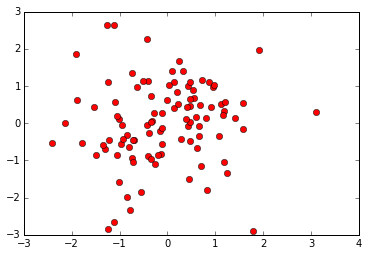

In [184]:
%matplotlib inline
import pandas as pd
import numpy as np

# Set some Pandas options
pd.set_option('display.notebook_repr_html', False)
pd.set_option('display.max_columns', 20)
pd.set_option('display.max_rows', 25)
plt.plot(np.random.normal(size=100), np.random.normal(size=100), 'ro')

In [180]:
# https://github.com/ipython/ipywidgets/blob/477cb8046e3217b134762f53c66816c45d688a20/examples/Using%20Interact.ipynb

from ipywidgets import interact, interactive, fixed
import ipywidgets as widgets

In [187]:
def f(x):
    return plt.plot(np.random.normal(size=x), np.random.normal(size=x), 'ro')

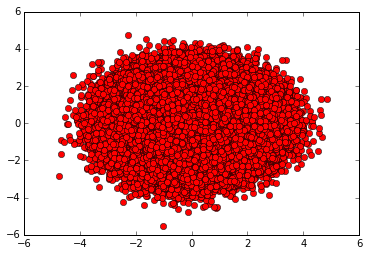

In [192]:
interact(f, x=[0, 1000000]);

In [195]:
def f(x):
    return x;

In [196]:
interact(f, x=True);

True

In [178]:
@interact(x=True, y=1.0)
def g(x, y):
    return (x, y)

(True, 0.5)

In [179]:
interact(f, x=widgets.IntSlider(min=-10,max=30,step=1,value=10));

10

In [47]:
interact(f, x=['a', 'b'])

'a'

<function __main__.f>

## Other datasets


https://www.quandl.com/api/v3/datasets/CHRIS/ICE_B1.json

In [197]:
url_atlas_countries = "http://atlas.cid.harvard.edu/api/dropdowns/countries/?lang=en"
opener = urllib.request.build_opener()
f = opener.open(url_atlas_countries)
file_atlas_countries = json.loads(f.read().decode('utf-8'))

In [198]:
file_atlas_countries

[['Angola', 'ago'],
 ['Albania', 'alb'],
 ['United Arab Emirates', 'are'],
 ['Argentina', 'arg'],
 ['Australia', 'aus'],
 ['Austria', 'aut'],
 ['Azerbaijan', 'aze'],
 ['Belgium', 'bel'],
 ['Bangladesh', 'bgd'],
 ['Bulgaria', 'bgr'],
 ['Bosnia and Herzegovina', 'bih'],
 ['Belarus', 'blr'],
 ['Bolivia', 'bol'],
 ['Brazil', 'bra'],
 ['Botswana', 'bwa'],
 ['Canada', 'can'],
 ['Switzerland', 'che'],
 ['Chile', 'chl'],
 ['China', 'chn'],
 ["Cote d'Ivoire", 'civ'],
 ['Cameroon', 'cmr'],
 ['Congo', 'cog'],
 ['Colombia', 'col'],
 ['Costa Rica', 'cri'],
 ['Cuba', 'cub'],
 ['Czech Republic', 'cze'],
 ['Germany', 'deu'],
 ['Denmark', 'dnk'],
 ['Dominican Republic', 'dom'],
 ['Algeria', 'dza'],
 ['Ecuador', 'ecu'],
 ['Egypt', 'egy'],
 ['Spain', 'esp'],
 ['Estonia', 'est'],
 ['Ethiopia', 'eth'],
 ['Finland', 'fin'],
 ['France', 'fra'],
 ['Gabon', 'gab'],
 ['United Kingdom', 'gbr'],
 ['Georgia', 'geo'],
 ['Ghana', 'gha'],
 ['Guinea', 'gin'],
 ['Greece', 'grc'],
 ['Guatemala', 'gtm'],
 ['Hong Kong', '

In [199]:
dict_atlas_countries = {}
for index, item in enumerate(file_atlas_countries):
    dict_atlas_countries[item[0]] = item[1]

In [200]:
interact(f, x=dict_atlas_countries)

TypeError: <http.client.HTTPResponse object at 0x10aa76eb8> is not a callable object

In [201]:
my_dict

{'Albania': 'alb',
 'Algeria': 'dza',
 'Angola': 'ago',
 'Argentina': 'arg',
 'Australia': 'aus',
 'Austria': 'aut',
 'Azerbaijan': 'aze',
 'Bangladesh': 'bgd',
 'Belarus': 'blr',
 'Belgium': 'bel',
 'Bolivia': 'bol',
 'Bosnia and Herzegovina': 'bih',
 'Botswana': 'bwa',
 'Brazil': 'bra',
 'Bulgaria': 'bgr',
 'Cambodia': 'khm',
 'Cameroon': 'cmr',
 'Canada': 'can',
 'Chile': 'chl',
 'China': 'chn',
 'Colombia': 'col',
 'Congo': 'cog',
 'Costa Rica': 'cri',
 "Cote d'Ivoire": 'civ',
 'Croatia': 'hrv',
 'Cuba': 'cub',
 'Czech Republic': 'cze',
 'Denmark': 'dnk',
 'Dominican Republic': 'dom',
 'Ecuador': 'ecu',
 'Egypt': 'egy',
 'El Salvador': 'slv',
 'Estonia': 'est',
 'Ethiopia': 'eth',
 'Finland': 'fin',
 'France': 'fra',
 'Gabon': 'gab',
 'Georgia': 'geo',
 'Germany': 'deu',
 'Ghana': 'gha',
 'Greece': 'grc',
 'Guatemala': 'gtm',
 'Guinea': 'gin',
 'Honduras': 'hnd',
 'Hong Kong': 'hkg',
 'Hungary': 'hun',
 'India': 'ind',
 'Indonesia': 'idn',
 'Iran': 'irn',
 'Ireland': 'irl',
 'Israe

'irl'

In [202]:
# TODO: update treemaps

In [18]:
from IPython.display import YouTubeVideo
YouTubeVideo('2FeugaLv5Bo')